# Examine CMIP6 gridded climate data on s3
CMIP6 projections of future climate variables are produced from a number of institutions using a variety of models. There is a lot of variation among these gridded results, so a good way to work with 'CMIP6' data is to build ensemble grids at each time step. This requires [1] access to a lot of data and [2] manipulation with `xarray` to read and reduce the data.

Understanding the metadata can be a challenge: https://cmor.llnl.gov/mydoc_cmor3_CV/

### Access and manipulation of CMIP6 grids to build ensemble maps for an extent.

Paul Montesano, PhD  
June 2024

**Goal:**  
Learn how to access and work with CMIP6 gridded data from all institutions

**Motivation:**    
Use of CMIP6 grids as input into future predictions probably warrants an ensemble approach for any given area of interest.  

To use the data in the way you need to:  
1. access the data in s3  
2. query to find the data you want  
3. iterate over query results to map/plot/crop/stack  
4. Reduce the xarray stack to a final ensemble result for a given variable / time range / extent  

**Resources:**  

Some previously prepared grids for this (ala those from worldclim 2.1): https://geodata.ucdavis.edu/cmip6/30s . These are "downscaled and calibrated" CMIP6 grids at 30sec res

**Other CMIP6 grid processing resources:**  
https://github.com/jbusecke/xMIP/blob/HEAD/docs/tutorial.ipynb  
https://gallery.pangeo.io/repos/pangeo-gallery/cmip6/basic_search_and_load.html  
https://aims2.llnl.gov/search/cmip6  
https://registry.opendata.aws/cmip6/

https://pangeo-data.github.io/pangeo-cmip6-cloud/accessing_data.html  
https://community-doc.s3.us-east-2.amazonaws.com/CMIP6_AWS_cloud_data_info_session.pdf  
https://ecmwf-projects.github.io/copernicus-training-c3s/projections-cmip6.html  
CMIP6 variables: https://pcmdi.llnl.gov/mips/cmip3/variableList.html#Highest_priority_output

https://claut.gitlab.io/man_ccia/lab2.html#earth-system-grid-federation

In [101]:
# This works to install packages in CoLab notebook: 
# https://colab.research.google.com/drive/1lGfN44H9ov6sPDfFYL05s7sySuituoCz#scrollTo=M16tx12Ka6Yu
#!conda install xarray-datatree intake-esm gcsfs xmip aiohttp nc-time-axis cf_xarray xarrayutils &> /dev/null

In [ ]:
pip install contextily

In [ ]:
pip install nc-time-axis

In [ ]:
pip install xmip

In [5]:
import nc_time_axis
import xmip
from xmip.preprocessing import *

In [6]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import shapely
from shapely.geometry import Point

import s3fs
import xarray as xr

# Connect to AWS S3 storage
s3 = s3fs.S3FileSystem(anon=True)

import zarr
import fsspec

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
plt.rcParams['figure.figsize'] = 12, 6

In [7]:
import contextily as ctx

## Set up a variety of study sites for CMIP6 analysis

In [223]:
site_dict_jornada = {'site': 'Jornada', 'lat': 32.733005,  'lon': -106.598134,  'extent': None}
site_dict_nome    = {'site': 'Nome',    'lat': 64.5849715, 'lon': -165.2897052, 'extent': None}
site_dict_above   = {'site': 'above',    'lat': 65, 'lon': -140,                'extent': (-170, -90, 55, 72)} # -166.02532596,   60.42331767, -113.06006406,   69.23227233

In [224]:
def get_site_point_gdf(sites_df):
    sites_df['geometry'] = list(zip(sites_df.lon, sites_df.lat))
    sites_df['geometry']  = sites_df['geometry'].apply(shapely.geometry.Point)
    sites_point_gdf = gpd.GeoDataFrame(sites_df, geometry='geometry', crs=4326)
    return sites_point_gdf
def get_focal_site_info(sites_gdf, site_name):
    #return (sites_gdf[sites_gdf.site==site_name].geometry.y[0], sites_gdf[sites_gdf.site==site_name].geometry.x[0])
    focal_lat = sites_gdf[sites_gdf.site==site_name].lat.iloc[0]
    focal_lon = sites_gdf[sites_gdf.site==site_name].lon.iloc[0]
    focal_extent = sites_gdf[sites_gdf.site==site_name].extent_cmip6.iloc[0]
    return focal_lat, focal_lon, focal_extent
def build_extent_geometry(extent):
    return shapely.geometry.box(extent[0], extent[2], extent[1], extent[3])
def build_extent(lon, lat, c=8):
    return (rounddown(lon)-c, roundup(lon)+c, int(rounddown(lat)-c/2), int(roundup(lat)+c/2))
def build_extent_cmip6_test(lon, lat, c=8):
    lon = get_lon_cmip6(lon)
    return build_extent(lon, lat)
def build_extent_cmip6(extent):
    return get_lon_cmip6(extent[0]), get_lon_cmip6(extent[1]), extent[2], extent[3]
def get_lon_cmip6(lon):
    if lon < 0: 
        return 360 + lon
    else:
        return lon
def roundup(x):
    import math
    return math.ceil(x / 10.0) * 10
def rounddown(x):
    import math
    return math.floor(x / 10.0) * 10

In [225]:
sites_df = pd.DataFrame.from_dict([site_dict_jornada, site_dict_nome, site_dict_above])
sites_df['lon_cmip6']    = sites_df['lon'].apply(lambda x: get_lon_cmip6(x))
sites_df['extent']       = sites_df.apply(lambda row: build_extent(row.lon, row.lat) if row.extent is None else row.extent, axis=1 )
sites_df['extent_cmip6'] = sites_df.apply(lambda x:   build_extent_cmip6(x.extent), axis=1 )
sites_df['geometry']     = sites_df.apply(lambda x:   build_extent_geometry(x.extent), axis=1 )
sites_gdf                = gpd.GeoDataFrame(data=sites_df, crs=4326, geometry=sites_df.geometry.to_list())

In [226]:
sites_gdf

,site,lat,lon,extent,lon_cmip6,extent_cmip6,geometry
0,Jornada,32.733005,-106.598134,"(-118, -92, 26, 44)",253.401866,"(242, 268, 26, 44)","POLYGON ((-92.00000 26.00000, -92.00000 44.000..."
1,Nome,64.584971,-165.289705,"(-178, -152, 56, 74)",194.710295,"(182, 208, 56, 74)","POLYGON ((-152.00000 56.00000, -152.00000 74.0..."
2,above,65.000000,-140.000000,"(-170, -90, 55, 72)",220.000000,"(190, 270, 55, 72)","POLYGON ((-90.00000 55.00000, -90.00000 72.000..."


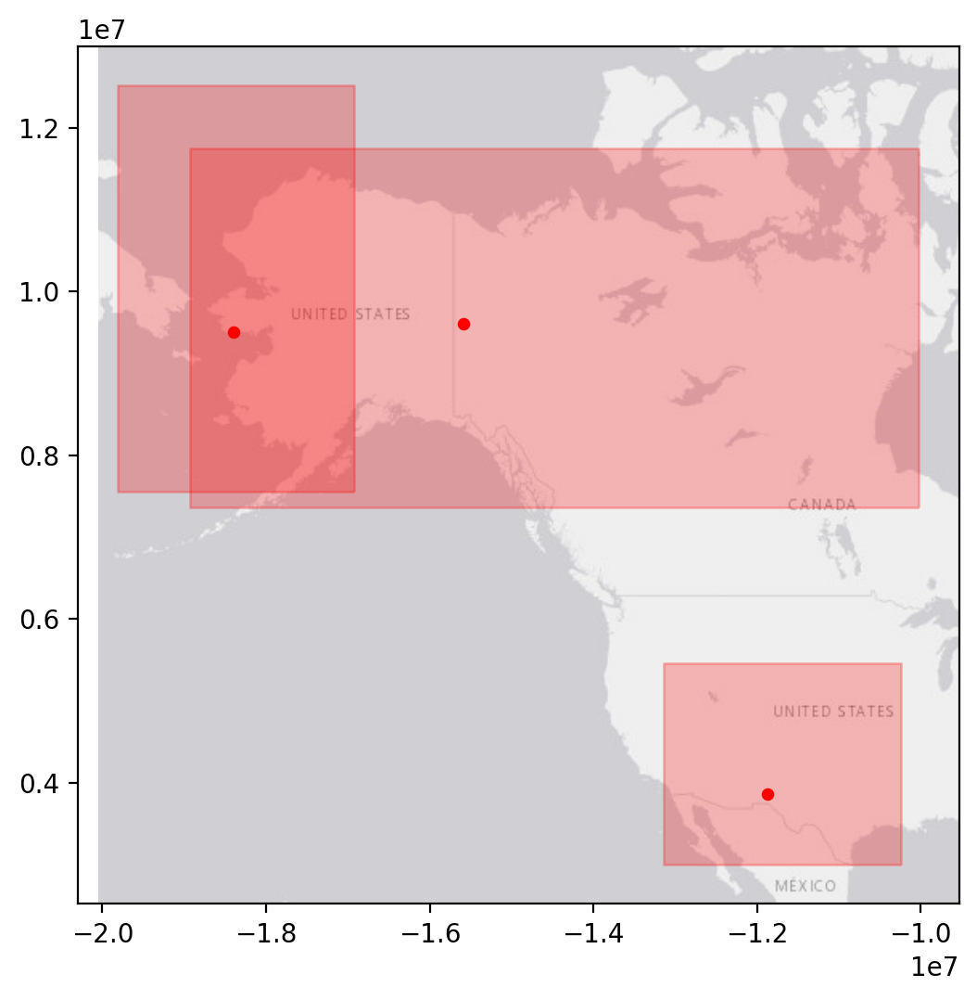

In [227]:
ax = sites_gdf.to_crs(3857).plot(ec='red', color='red', alpha=0.25)
ax = get_site_point_gdf(sites_df).to_crs(3857).plot(ax=ax, markersize=15, marker="o", color='red')
ctx.add_basemap(ax=ax, crs=3857, source='http://services.arcgisonline.com/ArcGIS/rest/services/Canvas/World_Light_Gray_Base/MapServer/tile/{z}/{y}/{x}')

### Choose site

In [228]:
FOCAL_LAT, FOCAL_LON, FOCAL_EXTENT = get_focal_site_info(sites_df, 'above')

print(f"{FOCAL_LAT}, {FOCAL_LON}, {FOCAL_EXTENT}")

65.0, -140.0, (190, 270, 55, 72)


### Choose CMIP6 details

In [295]:
FOCAL_SCENARIO = 'ssp245'
VAR = 'pr' #'tas' #'pr'
DIR_CMIP6 = f'/projects/my-public-bucket/databank/CMIP6/{FOCAL_SCENARIO}'
!mkdir -p $DIR_CMIP6

### Access: read the CMIP6 metadata from pangeo on s3

In [296]:
metadata_url = "https://cmip6-pds.s3.amazonaws.com/pangeo-cmip6.csv"

In [297]:
#cmip6_metadata_df = pd.read_csv('https://storage.googleapis.com/cmip6/cmip6-zarr-consolidated-stores.csv')
cmip6_metadata_df = pd.read_csv(metadata_url)
cmip6_metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 522217 entries, 0 to 522216
Data columns (total 11 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   activity_id     522217 non-null  object 
 1   institution_id  522217 non-null  object 
 2   source_id       522217 non-null  object 
 3   experiment_id   522217 non-null  object 
 4   member_id       522217 non-null  object 
 5   table_id        522217 non-null  object 
 6   variable_id     522217 non-null  object 
 7   grid_label      522217 non-null  object 
 8   zstore          522217 non-null  object 
 9   dcpp_init_year  141466 non-null  float64
 10  version         522217 non-null  int64  
dtypes: float64(1), int64(1), object(9)
memory usage: 43.8+ MB


### Query the s3 database of CMIP6 Earth System Models
We will want to create and ensemble across any GCM like the single one below with a query like this:  

**This is what we have been using for SIBBORK - its a single, fairly arbitrary CMIP6 grid**

```python
query_dict = dict(
             institution_id='CNRM-CERFACS',
             source_id='CNRM-CM6-1-HR',
             experiment_id='ssp585', 
             table_id='Amon',
             variable_id='tas',
             member_id = 'r1i1p1f2',
             grid_label='gr'
                 )
```
**The Nature Comms Earth & Env paper used WorldClim-processed grids - which were easy to ensemble:**  
https://geodata.ucdavis.edu/cmip6/30s (there is actually more than what were available at 30 s)


```python
query_dict = dict(
             experiment_id='ssp585', 
             table_id='Amon',
             variable_id='tas',
             grid_label='gr'
                 )
```

In [298]:
# Exclude models not used in WorldClim 30s data agg
# https://geodata.ucdavis.edu/cmip6/30s/
source_id_exclude_list=['CAMS-CSM1-0', 'CAS-ESM2-0', 'CESM2', 'CESM2-WACCM', 
                        'CIESM','CMCC-CM2-SR5','E3SM-1-1',
                        'EC-Earth3', 'EC-Earth3-CC', 'GFDL-CM4',
                        'FGOALS-f3-L', 'FGOALS-g3','IITM-ESM',
                        'KACE-1-0-G', 'KIOST-ESM', 'MCM-UA-1-0',
                        'NESM3', 'NorESM2-LM', 'NorESM2-MM', 'TaiESM1']

source_id_exclude_list += ['HadGEM3-GC31-LL'] # A number of theses were causing gridding and plotting problems - inconsistent time values?

In [299]:
query_dict_equal = dict(
             #institution_id='MOHC', #'CNRM-CERFACS',
             #source_id='GISS-E2-1-G',
             experiment_id=FOCAL_SCENARIO, 
             table_id='Amon',
             variable_id=VAR,
             #member_id = 'r1i1p1f2',
             #grid_label='gr'
            )
# query_dict_or = dict(
#     ssp1='ssp245',
#     ssp2='ssp585'   
# )

query_dict_notequal = dict(member_id = 'r1i1p1f1')

### Run the query to return a data frame of CMIP6 grid file paths

In [300]:
query_equal = ' & '.join(["{} == '{}'".format(k,v) for k,v in query_dict_equal.items()])  
query_source_id_exclude = ' & '.join(["source_id != '{}'".format(s) for s in source_id_exclude_list])
#query_dict_or = ' | '.join(["experiment_id == '{}'".format(v) for k,v in query_dict_or.items()])  
#query_notequal = ' and '.join(["{} != '{}'".format(k,v) for k,v in query_dict_notequal.items()])    


subset_df = cmip6_metadata_df.query(query_equal).query(query_source_id_exclude)#.query(query_dict_or)
print(subset_df.shape)

(276, 11)


In [301]:
print(sorted(subset_df.source_id.unique()))
len(subset_df.source_id.unique())

['ACCESS-CM2', 'ACCESS-ESM1-5', 'AWI-CM-1-1-MR', 'BCC-CSM2-MR', 'CMCC-ESM2', 'CNRM-CM6-1', 'CNRM-CM6-1-HR', 'CNRM-ESM2-1', 'CanESM5', 'CanESM5-CanOE', 'EC-Earth3-Veg', 'EC-Earth3-Veg-LR', 'FIO-ESM-2-0', 'GFDL-ESM4', 'GISS-E2-1-G', 'GISS-E2-1-H', 'INM-CM4-8', 'INM-CM5-0', 'IPSL-CM6A-LR', 'MIROC-ES2L', 'MIROC6', 'MPI-ESM1-2-HR', 'MPI-ESM1-2-LR', 'MRI-ESM2-0', 'UKESM1-0-LL']


25

In [302]:
subset_df.zstore.values[0:4]

array(['s3://cmip6-pds/CMIP6/ScenarioMIP/NOAA-GFDL/GFDL-ESM4/ssp245/r1i1p1f1/Amon/pr/gr1/v20180701/',
       's3://cmip6-pds/CMIP6/ScenarioMIP/NOAA-GFDL/GFDL-ESM4/ssp245/r2i1p1f1/Amon/pr/gr1/v20180701/',
       's3://cmip6-pds/CMIP6/ScenarioMIP/NOAA-GFDL/GFDL-ESM4/ssp245/r3i1p1f1/Amon/pr/gr1/v20180701/',
       's3://cmip6-pds/CMIP6/ScenarioMIP/IPSL/IPSL-CM6A-LR/ssp245/r1i1p1f1/Amon/pr/gr/v20190119/'],
      dtype=object)

### Write the CMIP6 metadata returned from query

In [303]:
CMIP6_MODEL = f'ensemble{len(subset_df):04}'
metadata_table_fn = f'{DIR_CMIP6}/metadata_{CMIP6_MODEL}_{VAR}_Amon_{FOCAL_SCENARIO.lower()}.csv'
subset_df.to_csv(metadata_table_fn)

### Build a list of datasets by iterating over list returned from query

**Use pre-processing from `XMIP`**
Try to use existing code to preprocess
https://github.com/jbusecke/xMIP/blob/aff665950556abc1bdbae521c308a86f9ef8899a/docs/tutorial.ipynb

Much of the XMIP pre-processing is based on the inital creation of a specific data dictionary done with `intake`. The dictionary is nice b/c it keeps the CMIP6 metadata with the gridded datasets themselves.  Not essential though. Below is how I was able to get the reads and preprocessing to work.


I never got this working on MAAP  
ToDo: cant get `intake.open_esm_datastore` working:  
https://gallery.pangeo.io/repos/pangeo-gallery/cmip6/intake_ESM_example.html
https://pangeo-data.github.io/pangeo-cmip6-cloud/accessing_data.html  
Possible solution?:  `intake_esm.esm_datastore()`

In [304]:
def xmip_preprocess_wrapper(ds):
    ds = ds.copy()
    ds = rename_cmip6(ds)
    ds = promote_empty_dims(ds)
    ds = broadcast_lonlat(ds)
    ds = replace_x_y_nominal_lat_lon(ds)
    return ds

In [305]:
def ds_tas_kelvin2celsius(ds):
    # Convert 'tas' from Kelvin to Celsius
    ds['tas'] = ds['tas'] - 273.15
    ds['tas'].attrs['units'] = '° C'
    ds['tas'].attrs['long_name'] = 'Near-Surface Air Temperature'
    return ds

In [306]:
def subset_cmip6_ds(ds, extent):
    
    # [1] Do we just use this? , but is the ds thats opened the same?
    #     https://github.com/jbusecke/xMIP/blob/HEAD/docs/tutorial.ipynb
    # [2] Looks like ensemble grids were made here? but where is the data?
    #     https://climate-scenarios.canada.ca/?page=cmip6-technical-notes#table-2
    
    # Basic first attempt
    min_lon, max_lon, min_lat, max_lat = extent
    subset_ds = ds.sel(y=slice(min_lat,max_lat), x=slice(min_lon,max_lon))#.tas#.sel({'time':'2016-01'})
    
    return subset_ds
    
def process_cmip6_ds(zarr_dir_path, EXTENT = (190, 230, 55, 75), CONVERT_KELVIN=True):

    # create a mutable-mapping-style interface to the store
    mapper = s3.get_mapper(zarr_dir_path)
    
    zarr_kwargs = {
        "consolidated": True,
        #"decode_times": False,
        #"use_cftime": False,
    }

    # [1] Open it using xarray and zarr
    # https://docs.xarray.dev/en/stable/generated/xarray.Dataset.convert_calendar.html
    ds = xr.open_zarr(mapper, **zarr_kwargs).convert_calendar("standard", align_on='date', use_cftime=True) #using 'align_on' = date or year will make this work, but the time-series line plots are interrupted...
    # [2] Pre-process
    ds = xmip_preprocess_wrapper(ds)
    # [3] Subset to extent
    ds = subset_cmip6_ds(ds, EXTENT)
    if CONVERT_KELVIN:
        # [4] Convert to Celsius
        ds = ds_tas_kelvin2celsius(ds)
    return ds

## Read & pre-process to build list of subsets
- Pre-processing seems to fix some time inconsistencies, among other things.  
- The geographic subsetting is very helpful for reducing file size.

**magic happens here**

In [307]:
FOCAL_EXTENT

(190, 270, 55, 72)

In [309]:
DO_CELSIUS = False

In [310]:
%%time

cmip6_ds_list = [process_cmip6_ds(zarr_dir_path, EXTENT = FOCAL_EXTENT, CONVERT_KELVIN=DO_CELSIUS) for zarr_dir_path in subset_df.zstore.values]
len(cmip6_ds_list)

CPU times: user 16.3 s, sys: 544 ms, total: 16.8 s
Wall time: 1min 42s


276

In [311]:
cmip6_ds_list[0]

<xarray.Dataset>
Dimensions:      (time: 1032, y: 17, x: 64, bnds: 2)
Coordinates:
  * time         (time) object 2015-01-16 12:00:00 ... 2100-12-16 12:00:00
  * bnds         (bnds) int64 0 1
    lon          (x, y) float64 190.6 190.6 190.6 190.6 ... 269.4 269.4 269.4
    lat          (x, y) float64 55.5 56.5 57.5 58.5 59.5 ... 68.5 69.5 70.5 71.5
  * x            (x) float64 190.6 191.9 193.1 194.4 ... 265.6 266.9 268.1 269.4
  * y            (y) float64 55.5 56.5 57.5 58.5 59.5 ... 68.5 69.5 70.5 71.5
Data variables:
    pr           (time, y, x) float32 dask.array<chunksize=(618, 17, 64), meta=np.ndarray>
    time_bounds  (time, bnds) object dask.array<chunksize=(1032, 2), meta=np.ndarray>
    lat_bounds   (y, bnds) float64 dask.array<chunksize=(17, 2), meta=np.ndarray>
    lon_bounds   (x, bnds) float64 dask.array<chunksize=(64, 2), meta=np.ndarray>
Attributes: (12/49)
    Conventions:            CF-1.7 CMIP-6.0 UGRID-1.0
    activity_id:            ScenarioMIP
    branch_method:          standard
    branch_time_in_child:   60225.0
    branch_time_in_parent:  60225.0
    comment:                <null ref>
    ...                     ...
    variable_id:            pr
    variant_info:           N/A
    variant_label:          r1i1p1f1
    status:                 2019-10-25;created;by nhn2@columbia.edu
    netcdf_tracking_ids:    hdl:21.14100/d8a738be-7c28-48b6-81eb-d8a93a170020
    version_id:             v20180701

## Build an ensemble of CMIP6 grids for subset

**Resources:**  
https://climate-scenarios.canada.ca/?page=cmip6-technical-notes  
https://www.nature.com/articles/s41597-023-02855-z

#### Ensemble median of **Near-Surface Air Temperature (monthly)** `TAS` 

Re-grid TAS to a common grid using interpolation  
 - use the first grid in the list as the grid to which other datasets will be regridded


~**TODO**~  
below i want to make sure to keep the metadata in `subset_df` associated with whatever list of datasets that I build.  The XMIP tutorials use fancy dictionaries to keep that info with the datasets - but I cannot load the libraries that let me work with the data in those ways....

**TODO** build dict to store metadata and interpolated ds

### Interpolate to first grid and convert to °C
** TODO: Check how interpolation is being handled (using first grid)**

In [312]:
cmip6_dsinterp_list = []
cmip6_dsinterp_dict_list = []

for i, ds in enumerate(cmip6_ds_list):
    
    cmip6_dsinterp_list.append(ds.drop_vars(['time_bounds'], errors='ignore').interp(y=cmip6_ds_list[0]["y"], x=cmip6_ds_list[0]["x"]))
    
    ds_dict = dict(subset_df.iloc[i])
    ds_dict['ds'] = ds.drop_vars(['time_bounds'], errors='ignore').interp(y=cmip6_ds_list[0]["y"], x=cmip6_ds_list[0]["x"])
    cmip6_dsinterp_dict_list.append(ds_dict)
    
print(len(cmip6_dsinterp_list), len(cmip6_dsinterp_dict_list))

276 276


In [313]:
# cmip6_dsinterp_list = []
# for ds in cmip6_ds_list:
#     ds = ds_tas_kelvin2celsius(ds)
#     cmip6_dsinterp_list.append(ds.drop_vars(['time_bounds'], errors='ignore').interp(y=cmip6_ds_list[0]["y"], x=cmip6_ds_list[0]["x"]))
# len(cmip6_dsinterp_list)

In [314]:
# cmip6_dsinterp_dict_list = []
# for i, ds in enumerate(cmip6_ds_list):
#     ds_dict = dict(subset_df.iloc[i])
#     ds_dict['ds'] = ds.drop_vars(['time_bounds'], errors='ignore').interp(y=cmip6_ds_list[0]["y"], x=cmip6_ds_list[0]["x"])
#     cmip6_dsinterp_dict_list.append(ds_dict)
# len(cmip6_dsinterp_dict_list)

In [315]:
institution_id_list = list(set([cmip6_dsinterp_dict_list[i]['institution_id'] for i,ds in enumerate(cmip6_dsinterp_dict_list)]))
print(institution_id_list)

['AWI', 'NASA-GISS', 'MOHC', 'FIO-QLNM', 'CNRM-CERFACS', 'NIMS-KMA', 'CCCma', 'EC-Earth-Consortium', 'MIROC', 'INM', 'MRI', 'IPSL', 'DKRZ', 'CSIRO', 'CMCC', 'NOAA-GFDL', 'MPI-M', 'CSIRO-ARCCSS', 'BCC']


In [316]:
# # Check for much longer time series - indicative of institutions with $$$
# for i,ds in enumerate(cmip6_dsinterp_list):
#     if len(ds.time) > 2000:
#         #print(len(ds.time))
#         print(subset_df.iloc[i])

### Stacking

**WARNING!** here, the attributes that are carried through are those from the first dataset in the list - do something to carry attributes through for EACH item in list  
**WARNING!** concat over large list of models will probably fail - lots of inconsistencies among data



In [317]:
dim_name = 'source_id'
ds_combine_01 = xr.concat(cmip6_dsinterp_list[0:1], dim = dim_name, coords='minimal',compat='override')
ds_combine_05 = xr.concat(cmip6_dsinterp_list[0:5], dim = dim_name, coords='minimal',compat='override')
ds_combine_25 = xr.concat(cmip6_dsinterp_list[0:25], dim = dim_name, coords='minimal',compat='override')
ds_combine_75 = xr.concat(cmip6_dsinterp_list[0:75], dim = dim_name, coords='minimal',compat='override')
ds_combine = xr.concat(cmip6_dsinterp_list, dim = dim_name, coords='minimal',compat='override')

### Point-specific time-series for each model (line plots)

`questions`:
1. why are all the lines not appearing?
2. why are some interrupted?

**ToDo:** 
1. want ds attributes available to use them to identify and group these model results - 

In [250]:
len(ds_combine[dim_name])

276

In [251]:
def convert_to_cftime(date_str):
    import cftime
    # Parse the string assuming it is in the format 'YYYY-MM'
    year, month = map(int, date_str.split('-'))
    # Create a CFTimeIndex object
    cftime_date = cftime.DatetimeGregorian(year, month, 1)
    return cftime_date

In [252]:
def plot_combined_v2(cmip6_dsinterp_dict_list, FOCAL_LAT, FOCAL_LON, SSP=FOCAL_SCENARIO, YR_RANGE=('2040','2060'), DIM_NAME='source_id', HIGHLIGHT_DATE=None):
    from matplotlib import pyplot as plt
    import matplotlib.dates as mdates
    fig, ax = plt.subplots(1,1, figsize=(20,5))
    ax.grid(True)

    y1, y2 = YR_RANGE

    # Specify the month and year for the vertical line
    specific_date = convert_to_cftime(HIGHLIGHT_DATE)

    # Add the vertical dotted line
    ax.axvline(x=specific_date, color='r', linestyle='--', label=None)
    ax.text(specific_date, 0.99, f'Map date: {specific_date.strftime("%Y-%m")}', color='r', ha='right', va='top', rotation=90,transform=ax.get_xaxis_transform())
    
    line_kwds = {'linewidth':0.1, 'alpha':1, 'linestyle':'--', 'add_legend':True}
    
    institution_id_list = list(set([cmip6_dsinterp_dict_list[i]['institution_id'] for i,ds in enumerate(cmip6_dsinterp_dict_list)]))
    cmap = plt.get_cmap('tab20')
    institution_color_list = cmap(np.linspace(0, 1, len(institution_id_list)))
    used_institution_id_list = []
    for j, d in enumerate(cmip6_dsinterp_dict_list):
        for i, (institution_id, institution_color) in enumerate(zip(institution_id_list, institution_color_list)):
            if institution_id is d['institution_id']:
                if institution_id not in used_institution_id_list:
                    used_institution_id_list += [institution_id]
                else:
                    institution_id = None
                try:
                    # Line plot of all models (bands) for a single lat lon
                    #d['ds'] = ds_tas_kelvin2celsius(d['ds'])
                    d['ds'].tas.sel(y=FOCAL_LAT, x=180+(FOCAL_LON), 
                                    method='nearest').sel(time=slice(y1,y2)).plot.line(ax=ax, x="time", 
                                                                                                        color=institution_color, 
                                                                                                        #alpha=0.5 + (1/len(cmip6_dsinterp_dict_list)), 
                                                                                                        **line_kwds,
                                                                                                        label=institution_id)
                except:
                    print(f"Failed at {institution_id} | {d['source_id']} | {d['member_id']}")
    # Formatting the plot
    #ax.xaxis.set_major_locator(mdates.YearLocator(1))  # Major ticks every 10 years
    ax.xaxis.set_minor_locator(mdates.YearLocator(1))  # Minor ticks every year
    #ax.xaxis.set_major_locator(plt.MaxNLocator(20))  # Control the number of grid lines
    #ax.tick_params(axis='x', rotation=45)
    ax.set_title(f"Average Monthly Temperature ({y1}-{y2}) at {FOCAL_LAT}, {FOCAL_LON}\n{len(cmip6_dsinterp_dict_list)} CMIP6 models ({SSP})")
    ax.set_xlabel('Date')
    #ax.set_ylabel('Temperature (°K)')
    #ax.legend()
    plt.legend(title='Institution ID')
    
    plt.show()
    ax = None
    plt = None

In [253]:
def plot_combined(ds_comb, FOCAL_LAT, FOCAL_LON, SSP=FOCAL_SCENARIO, YR_RANGE=('2040','2060'), DIM_NAME='source_id', HIGHLIGHT_DATE=None):
    from matplotlib import pyplot as plt
    import matplotlib.dates as mdates
    fig, ax = plt.subplots(1,1, figsize=(20,2))
    ax.grid(True)

    y1, y2 = YR_RANGE

    # Specify the month and year for the vertical line
    specific_date = convert_to_cftime(HIGHLIGHT_DATE)

    # Add the vertical dotted line
    ax.axvline(x=specific_date, color='r', linestyle='--', label=None)
    ax.text(specific_date, 0.99, f'Map date: {specific_date.strftime("%Y-%m")}', color='r', ha='right', va='top', rotation=90,transform=ax.get_xaxis_transform())

    # Line plot of all models (bands) for a single lat lon
    #ds_comb = ds_tas_kelvin2celsius(ds_comb)
    if ds_comb.dims['source_id'] > 1 : 
        ALPHA = 0.1 + (1/ds_comb.dims['source_id'])
    else:
        ALPHA = 1
    ds_comb.tas.sel(y=FOCAL_LAT, x=180+(FOCAL_LON), method='nearest').sel(time=slice(y1,y2)).plot.line(ax=ax, x="time", color='orange', alpha=ALPHA)

    # Formatting the plot
    #ax.xaxis.set_major_locator(mdates.YearLocator(1))  # Major ticks every 10 years
    ax.xaxis.set_minor_locator(mdates.YearLocator(1))  # Minor ticks every year
    #ax.xaxis.set_major_locator(plt.MaxNLocator(20))  # Control the number of grid lines
    #ax.tick_params(axis='x', rotation=45)
    ax.set_title(f"Average Monthly Temperature ({y1}-{y2}) at {FOCAL_LAT}, {FOCAL_LON}\n{len(ds_comb[DIM_NAME])} CMIP6 models ({SSP})")
    ax.set_xlabel('Date')
    #ax.set_ylabel('Temperature (°K)')
    plt.legend().remove()
    
    plt.show()
    ax = None
    plt = None

In [254]:
def plot_ensemble(ds_comb, FOCAL_LAT, FOCAL_LON, SSP=FOCAL_SCENARIO, YR_RANGE=('2040','2060'), DIM_NAME='source_id', HIGHLIGHT_DATE=None):
    
    from matplotlib import pyplot as plt
    import matplotlib.dates as mdates
    fig, ax = plt.subplots(1, 1, figsize=(20,2))
    ax.grid(True)

    y1, y2 = YR_RANGE

    if HIGHLIGHT_DATE is not None:
        # Specify the month and year for the vertical line
        specific_date = convert_to_cftime(HIGHLIGHT_DATE)

        # Add the vertical dotted line
        ax.axvline(x=specific_date, color='r', linestyle='--')
        ax.text(specific_date, 0.99, f'Map date: {specific_date.strftime("%Y-%m")}', color='r', ha='right', va='top', rotation=90, transform=ax.get_xaxis_transform())
    
    #ds_comb = ds_tas_kelvin2celsius(ds_comb)

    ds_med = ds_comb.tas.sel(y=FOCAL_LAT, x=180+(FOCAL_LAT), method='nearest').median(dim="source_id").sel(time=slice(y1,y2))
    ds_upr = ds_comb.tas.sel(y=FOCAL_LAT, x=180+(FOCAL_LAT), method='nearest').min(dim="source_id").sel(time=slice(y1,y2))
    ds_lwr = ds_comb.tas.sel(y=FOCAL_LAT, x=180+(FOCAL_LAT), method='nearest').max(dim="source_id").sel(time=slice(y1,y2))

    # https://comptools.climatematch.io/tutorials/W2D1_FutureClimate-IPCCIPhysicalBasis/student/W2D1_Tutorial4.html
    ax.fill_between(ds_lwr.time.data, ds_lwr, ds_upr, alpha=0.5, color='orange')

    # Add min,max,median
    line_kwds = {'linewidth':0.5, 'alpha':1, 'linestyle':'--', 'add_legend':True}
    ds_med.plot.line(ax=ax, x="time", label='median', color='black', **line_kwds)
    ds_upr.plot.line(ax=ax, x="time", label='min', color='gray', **line_kwds)
    ds_lwr.plot.line(ax=ax, x="time", label='max', color='gray', **line_kwds)

    # Formatting the plot
    ax.xaxis.set_minor_locator(mdates.YearLocator(1))  # Minor ticks every year
    ax.set_title(f"Ensemble Average Monthly Temperature ({y1}-{y2}) at {FOCAL_LAT}, {FOCAL_LON}\n{len(ds_comb[DIM_NAME])} CMIP6 models ({SSP})")
    ax.set_xlabel('Date')
    ax.set_ylabel("Near-Surface Air Temperature\n[°C]")
    ax.legend()
    plt.show() 
    ax = None
    plt = None

In [255]:
MAP_DATE = '2050-06'

#### Plot various groups of datasets, indexed from 0

Failed at AWI | AWI-CM-1-1-MR | r1i1p1f1
Failed at MPI-M | MPI-ESM1-2-LR | r6i1p1f1
Failed at None | MPI-ESM1-2-LR | r8i1p1f1
Failed at None | MPI-ESM1-2-LR | r7i1p1f1
Failed at None | MPI-ESM1-2-LR | r2i1p1f1
Failed at None | MPI-ESM1-2-LR | r10i1p1f1
Failed at None | MPI-ESM1-2-LR | r5i1p1f1
Failed at None | MPI-ESM1-2-LR | r1i1p1f1
Failed at None | MPI-ESM1-2-LR | r3i1p1f1
Failed at None | MPI-ESM1-2-LR | r9i1p1f1
Failed at None | MPI-ESM1-2-HR | r2i1p1f1
Failed at None | GISS-E2-1-G | r8i1p5f2
Failed at None | GISS-E2-1-G | r7i1p5f2
Failed at None | GISS-E2-1-G | r10i1p5f2
Failed at None | GISS-E2-1-G | r2i1p5f2
Failed at None | GISS-E2-1-G | r1i1p5f2
Failed at None | GISS-E2-1-G | r3i1p5f2
Failed at None | GISS-E2-1-G | r5i1p5f2
Failed at None | GISS-E2-1-G | r4i1p5f2
Failed at None | GISS-E2-1-G | r6i1p5f2
Failed at None | GISS-E2-1-G | r9i1p5f2


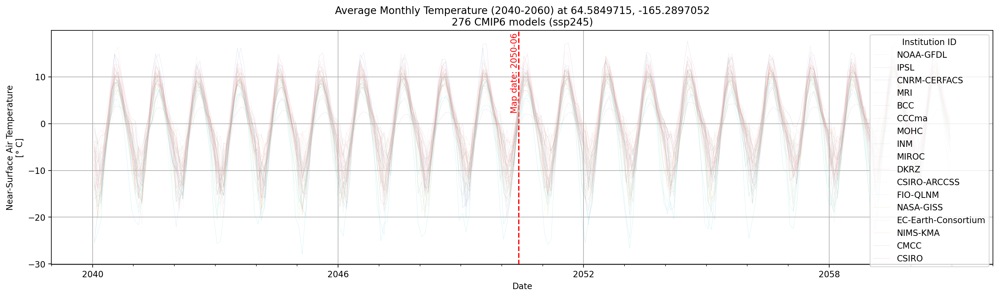

In [203]:
plot_combined_v2(cmip6_dsinterp_dict_list, FOCAL_LAT, FOCAL_LON, YR_RANGE=('2040','2060'), DIM_NAME='source_id', HIGHLIGHT_DATE=MAP_DATE)

/opt/conda/envs/pangeo/lib/python3.10/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


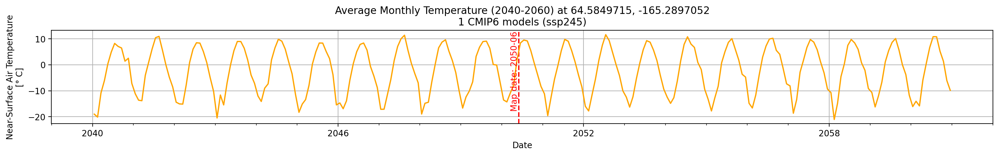

In [204]:
plot_combined(ds_combine_01, FOCAL_LAT, FOCAL_LON, YR_RANGE=('2040','2060'), DIM_NAME='source_id', HIGHLIGHT_DATE=MAP_DATE)

/opt/conda/envs/pangeo/lib/python3.10/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


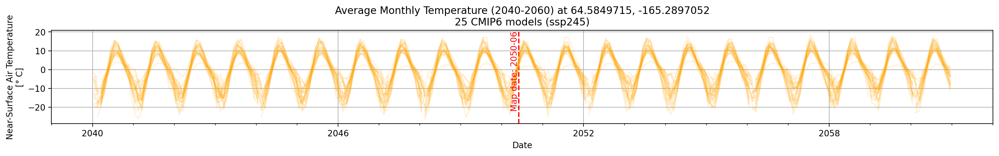

In [205]:
plot_combined(ds_combine_25, FOCAL_LAT, FOCAL_LON, YR_RANGE=('2040','2060'), DIM_NAME='source_id', HIGHLIGHT_DATE=MAP_DATE)

/opt/conda/envs/pangeo/lib/python3.10/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


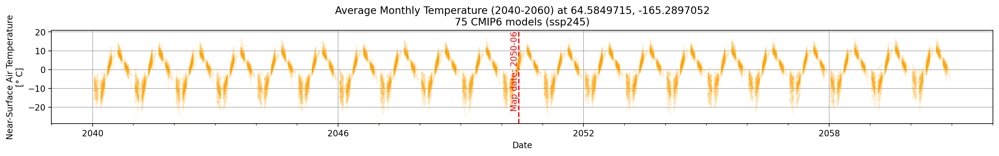

In [206]:
plot_combined(ds_combine_75, FOCAL_LAT, FOCAL_LON, YR_RANGE=('2040','2060'), DIM_NAME='source_id', HIGHLIGHT_DATE=MAP_DATE)

#### TODO: why is concatenation weird?
 - indexing random ds sets wont work as expected
 - y-axis magnitude not right

/opt/conda/envs/pangeo/lib/python3.10/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


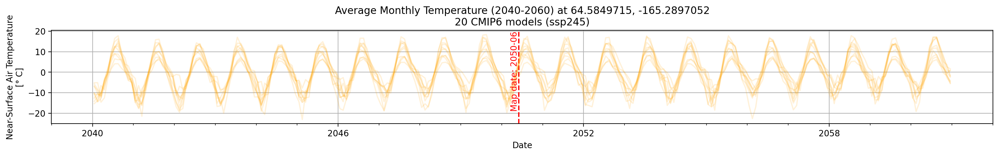

In [207]:
ds_combine_tmp = xr.concat(cmip6_dsinterp_list[80:100], dim = dim_name, compat="no_conflicts")#, coords='minimal',compat='override')

plot_combined(ds_combine_tmp, FOCAL_LAT, FOCAL_LON, YR_RANGE=('2040','2060'), DIM_NAME='source_id', HIGHLIGHT_DATE=MAP_DATE)

/opt/conda/envs/pangeo/lib/python3.10/site-packages/xarray/core/utils.py:494: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  warnings.warn(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


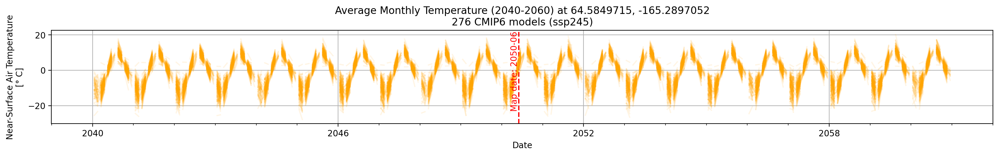

In [208]:
plot_combined(ds_combine, FOCAL_LAT, FOCAL_LON, YR_RANGE=('2040','2060'), DIM_NAME='source_id', HIGHLIGHT_DATE=MAP_DATE)

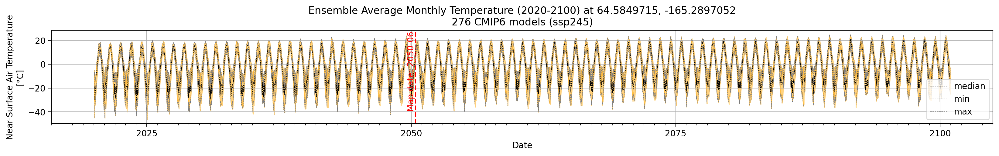

CPU times: user 15min 18s, sys: 5min 40s, total: 20min 58s
Wall time: 9min 23s


In [53]:
%%time
plot_ensemble(ds_combine, FOCAL_LAT, FOCAL_LON, YR_RANGE=('2020','2100'), DIM_NAME='source_id', HIGHLIGHT_DATE=MAP_DATE)

In [ ]:
%%time
plot_ensemble(ds_combine, FOCAL_LAT, FOCAL_LON, YR_RANGE=('2100','2125'), DIM_NAME='source_id', HIGHLIGHT_DATE=None)

## Single model monthly map

In [318]:
institution_id_list = list(set([cmip6_dsinterp_list[i].attrs['institution_id'] for i,ds in enumerate(cmip6_dsinterp_list)]))
experiment_id_list  = list(set([cmip6_dsinterp_list[i].attrs['experiment_id'] for i,ds in enumerate(cmip6_dsinterp_list)]))

In [319]:
prj_kwargs={'projection':ccrs.PlateCarree()}
#prj_kwargs={'projection':ccrs.NorthPolarStereo()}

def prep_plot(NCOL=1, IDX=1, prj_kwargs=prj_kwargs):
    
    fig = plt.figure(1, figsize=[15,3])

    # We're using cartopy and are plotting in Orthographic projection 
    # (see documentation on cartopy)
    ax = plt.subplot(1, NCOL, IDX, **prj_kwargs)
    ax.coastlines(linewidth=0.5)
    ax.add_feature(cfeature.STATES, linestyle='--', linewidth=0.5)
    ax.add_feature(cfeature.RIVERS, color='w', alpha=1, linewidth=0.25)
    
    return ax

def map_date_single_model(ds, MAP_DATE=MAP_DATE, COORDS=(None, None)):
    
    ax = prep_plot()
    
    # We need to project our data to the new Orthographic projection and for this we use `transform`.
    # we set the original data projection in transform (here PlateCarree)
    #cmip6_dsinterp_listds_idx]['tas'].isel(time=0).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='coolwarm')
    ds['tas'].sel({'time':MAP_DATE}).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='Spectral_r', vmin=-5, vmax=15, extend='both')
    
    LON, LAT = COORDS
    if LON is not None and LAT is not None:
        plt.plot(LON, LAT, transform=ccrs.PlateCarree(), markersize=10, marker=".", markeredgecolor ="k", markerfacecolor='w' )

    # One way to customize your title
    model_info = ".".join([ds.attrs[v] for v in ['experiment_id','parent_source_id','source_type','variant_label']])
    plt.title(f"{ds.sel({'time':MAP_DATE}).time.values[0].strftime('%B %Y')}\n{model_info}", fontsize=12)

In [320]:
def map_date_ensemble_model(ds_combine, experiment_id_list, DIM_NAME='source_id', HIGHLIGHT_DATE=MAP_DATE):
    
    ax1 = prep_plot(NCOL=2, IDX=1)
    ds_combine.median(dim=DIM_NAME).tas.sel({'time':HIGHLIGHT_DATE}).plot(ax=ax1, transform=ccrs.PlateCarree(), cmap='Spectral_r',cbar_kwargs=cbar_kwargs)
    
    # One way to customize your title
    title_str = ds.sel({'time':HIGHLIGHT_DATE}).time.values[0].strftime('%B %Y')
    plt.title(f"{title_str}\n{experiment_id_list} {len(ds_combine[DIM_NAME])} model ensemble median", fontsize=14)
    
    ax2 = prep_plot(NCOL=2, IDX=2)
    ds_combine.std(dim=DIM_NAME).tas.sel({'time':HIGHLIGHT_DATE}).plot(ax=ax2, transform=ccrs.PlateCarree(), cmap='magma', cbar_kwargs = cbar_kwargs)

    # One way to customize your title
    title_str = ds.sel({'time':HIGHLIGHT_DATE}).time.values[0].strftime('%B %Y')
    plt.title(f"{title_str}\n{experiment_id_list} {len(ds_combine[DIM_NAME])} model ensemble std", fontsize=14)

KeyError: "No variable named 'tas'. Variables on the dataset include ['time', 'pr', 'lat_bounds', 'lon_bounds', 'bnds', 'lon', 'lat', 'y', 'x']"

/opt/conda/envs/pangeo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '


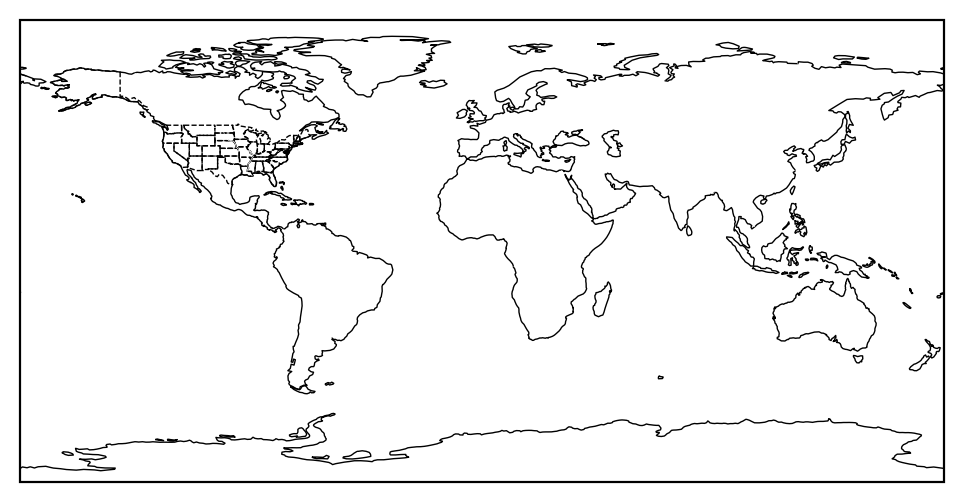

In [321]:
map_date_single_model(cmip6_dsinterp_list[1], MAP_DATE=MAP_DATE, COORDS=(FOCAL_LON, FOCAL_LAT))

In [ ]:
map_date_single_model(ds=cmip6_dsinterp_list[74], MAP_DATE=MAP_DATE, COORDS=(FOCAL_LON, FOCAL_LAT))

In [ ]:
map_date_single_model(ds=cmip6_dsinterp_list[75], MAP_DATE=MAP_DATE, COORDS=(FOCAL_LON, FOCAL_LAT))

In [ ]:
map_date_single_model(ds=cmip6_dsinterp_list[76], MAP_DATE=MAP_DATE, COORDS=(FOCAL_LON, FOCAL_LAT))

In [ ]:
map_date_single_model(ds=cmip6_dsinterp_list[200], MAP_DATE=MAP_DATE, COORDS=(FOCAL_LON, FOCAL_LAT))

## Ensemble monthly median map

The median ensemble map for a month & year from 

In [264]:
cbar_kwargs = {'orientation':'vertical', 'shrink':1,'label':'Near-Surface Air Temperature\n[K]', 'extend':'both'}

/opt/conda/envs/pangeo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/opt/conda/envs/pangeo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/opt/conda/envs/pangeo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/opt/conda/envs/pangeo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/opt/conda/envs/pangeo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as i

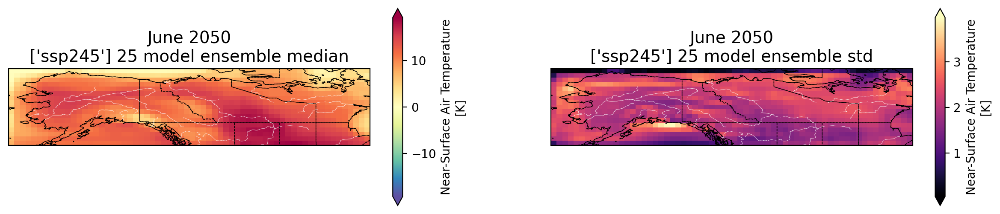

In [265]:
map_date_ensemble_model(ds_combine_25, experiment_id_list, HIGHLIGHT_DATE=MAP_DATE)

/opt/conda/envs/pangeo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/opt/conda/envs/pangeo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/opt/conda/envs/pangeo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/opt/conda/envs/pangeo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnings.warn('facecolor will have no effect as it has been '
/opt/conda/envs/pangeo/lib/python3.10/site-packages/cartopy/mpl/style.py:76: UserWarning: facecolor will have no effect as i

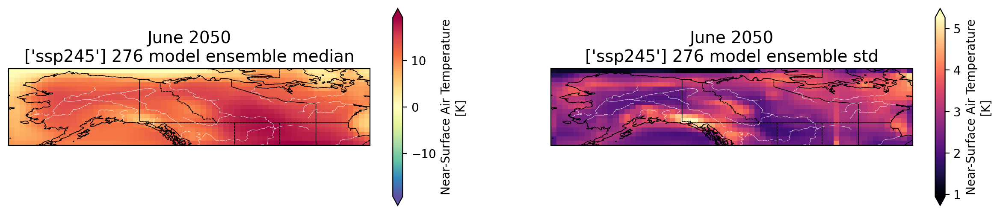

In [266]:
map_date_ensemble_model(ds_combine, experiment_id_list, HIGHLIGHT_DATE=MAP_DATE)

# Write out ensemble median CMIP map

In [ ]:
ds_median = ds_combine.median(dim='source_id')

In [ ]:
len(ds_combine['source_id'])

In [ ]:
if VAR == 'tas':
    DESC = "Ensemble temperature"
    if DO_CELSIUS: 
        UNITS = "Celsius"
    else:
        UNITS = "Kelvin"  
if VAR == 'pr':
    DESC = "Ensemble precipitation"
    UNITS = '?'


In [ ]:
ds_median.assign_attrs(units = UNITS, 
                       description = DESC, 
                       metadata_table = metadata_table_fn, 
                       n_source_models = len(ds_combine['source_id'])
                      )

In [ ]:
'_'.join([str(i) for i in FOCAL_EXTENT])

In [ ]:
out_netcdf_fn = f"{DIR_CMIP6}/{VAR}_Amon_{FOCAL_SCENARIO.lower()}_{CMIP6_MODEL}_extent{'_'.join([str(i) for i in FOCAL_EXTENT])}.nc"
out_netcdf_fn

In [ ]:
ds_median.to_netcdf(out_netcdf_fn)

# Subset to time interval

In [286]:
t1, t2 = ('2014','2100')

In [287]:
ds_combine_interval = ds_combine.sel(time=slice(t1,t2))

### Count per pixel

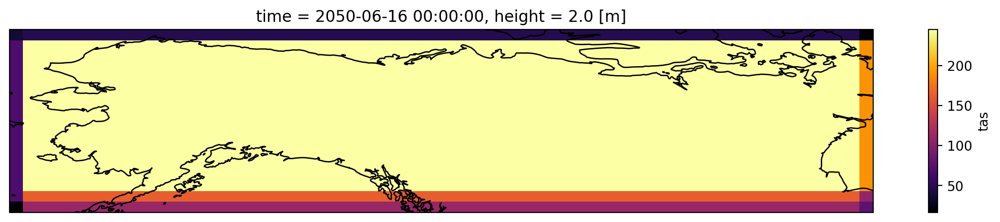

In [288]:
fig = plt.figure(1, figsize=(15,2.5))
ax = plt.subplot(1, 1, 1, **prj_kwargs)
ax.coastlines()
ds_combine_interval.count(dim="source_id").tas.sel({'time':MAP_DATE}).plot(ax=ax, transform=ccrs.PlateCarree(), cmap='inferno')

# Trend

In [306]:
import scipy
from scipy import *
import dask
def new_linregress(x, y):
    # Wrapper around scipy linregress to use in apply_ufunc
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    return np.array([slope, intercept, r_value, p_value, std_err])

In [ ]:
# return a new DataArray ; https://stackoverflow.com/questions/52094320/with-xarray-how-to-parallelize-1d-operations-on-a-multidimensional-dataset
ds = ds_combine_interval.median(dim="source_id").tas
stats = xr.apply_ufunc(new_linregress, ds.x, ds.y,
                       input_core_dims=[['time'], ['time']],
                       output_core_dims=[["parameter"]],
                       vectorize=True,
                       dask="parallelized",
                       output_dtypes=['float64'],
                       output_sizes={"parameter": 5},
                      )

In [ ]:
# https://comptools.climatematch.io/tutorials/W2D1_FutureClimate-IPCCIPhysicalBasis/student/W2D1_Tutorial2.html
# https://comptools.climatematch.io/tutorials/W2D1_FutureClimate-IPCCIPhysicalBasis/student/W2D1_Tutorial3.html

In [57]:
EXTENT_southwestUS

NameError: name 'EXTENT_southwestUS' is not defined

In [58]:
# To pandas dataframe...
df = ds_combine_interval.tas.median(dim="source_id").sel(time=slice('2015','2016')).sel(x=260, y=[25], method='nearest').to_pandas()

NameError: name 'ds_combine_interval' is not defined

In [302]:
df.head()

y,25.5
time,
2015-01-16 00:00:00,286.357178
2015-01-16 12:00:00,287.655138
2015-02-15 00:00:00,289.429506
2015-02-16 00:00:00,288.522009
2015-03-16 00:00:00,292.373853


CPU times: user 1min 49s, sys: 33.3 s, total: 2min 22s
Wall time: 1min


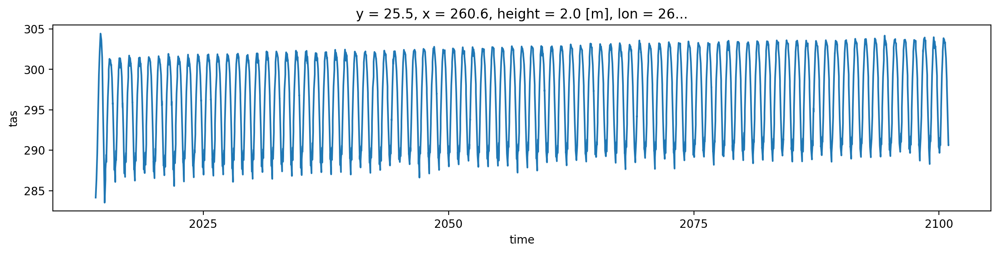

In [290]:
%%time
ds_combine_interval.tas.median(dim="source_id").sel(x=260, y=[25], method='nearest').plot(x="time", add_legend=True, figsize=(15,3))

In [ ]:
#cmip6_dsinterp_list[ds_idx]['tas']

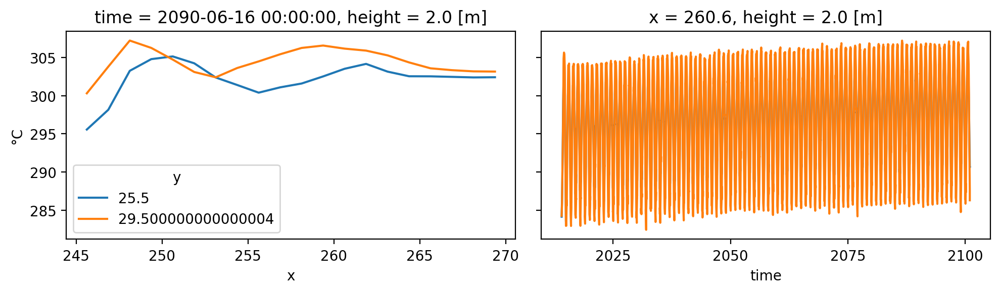

In [303]:
# Prepare the figure
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3), sharey=True)

# Temperature vs longitude plot - illustrates the "hue" kwarg
ds_combine_interval.median(dim="source_id").tas.sel({'time':time_str}).isel(time=0).sel(y=[25,30], method='nearest').plot.line(ax=ax1, hue="y" )
ax1.set_ylabel("°C")

# Temperature vs time plot - illustrates the "x" and "add_legend" kwargs
ds_combine_interval.median(dim="source_id").tas.sel(x=260, y=[25,30], method='nearest').plot.line(ax=ax2, x="time", add_legend=False)
ax2.set_ylabel("")

# Show
plt.tight_layout()

## Use NASA Global Daily Downscaled CMIP6 Projections
https://registry.opendata.aws/nex-gddp-cmip6/  
https://www.nature.com/articles/s41597-022-01393-4

**ToDo**  
stack these COGs for `tas` and `pr` and save as an xarray dataset?  

https://gis.stackexchange.com/questions/449759/convert-a-multiband-geotiff-to-a-timeseries-netcdf-file-in-xarray

In [282]:
import rioxarray
import rasterio
from rasterio.plot import show

In [283]:
s3 = s3fs.S3FileSystem(anon=True)

In [284]:
s3.glob('s3://nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/*')

['nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/hurs',
 'nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/huss',
 'nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/pr',
 'nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/rlds',
 'nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/rsds',
 'nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/sfcWind',
 'nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/tas',
 'nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/tasmax',
 'nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/tasmin']

In [231]:
#s3.ls('s3://nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/tas/')

In [240]:
s3.download(s3_pr_list[1],'/projects/my-public-bucket')

[None]

In [285]:
s3_tas_list = s3.glob('s3://nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/tas/*')
s3_pr_list =  s3.glob('s3://nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/pr/*')

In [286]:
time = s3_pr_list[0].split("_")[-1].split('.')[0]
dt = datetime.strptime(time,"%Y%m")
if dt < datetime.strptime('200001',"%Y%m"): print('y')

y


In [287]:
from datetime import datetime
import pandas as pd

In [288]:
#collecting datasets when looping over your files
list_da = []

for fn in s3_tas_list[1:]:

    time = fn.split("_")[-1].split('.')[0]
    dt = datetime.strptime(time,"%Y%m")
    dt = pd.to_datetime(dt)
    
    if dt < datetime.strptime('198001',"%Y%m"):
        pass
    else:
        da = rioxarray.open_rasterio('s3://' + fn)
        da = da.assign_coords(time = dt)
        da = da.expand_dims(dim="time")

        list_da.append(da)

#stack dataarrays in list
ds = xr.combine_by_coords(list_da)
ds

RasterioIOError: '/vsis3/nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/tas/tas_month_ensemble-median_historical_198001.tif' not recognized as a supported file format.

In [227]:
d = rioxarray.open_rasterio('s3://' + s3_tas_list[3])
d.plot()

RasterioIOError: '/vsis3/nex-gddp-cmip6-cog/monthly/CMIP6_ensemble_median/tas/tas_month_ensemble-median_historical_195004.tif' not recognized as a supported file format.

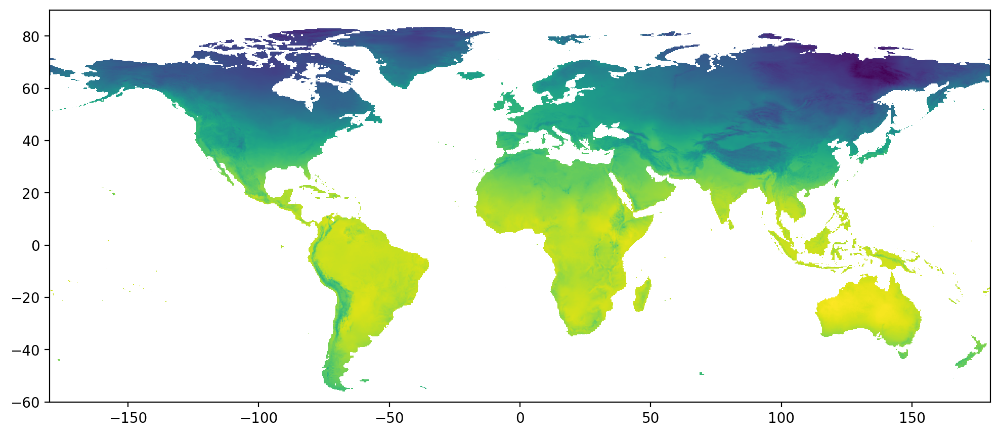

In [203]:
with rasterio.env.Env(AWS_NO_SIGN_REQUEST = 'YES'):
    with rasterio.open('s3://' + s3_tas_list[0]) as src:
        show(src)

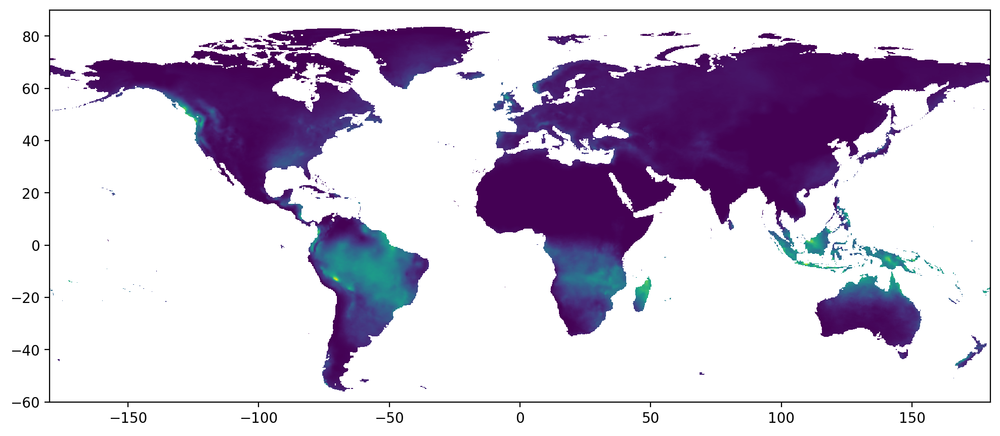

In [208]:
with rasterio.env.Env(AWS_NO_SIGN_REQUEST = 'YES'):
    with rasterio.open('s3://' + s3_pr_list[0]) as src:
        show(src)

# 
#
# Miscellaneous stuff below

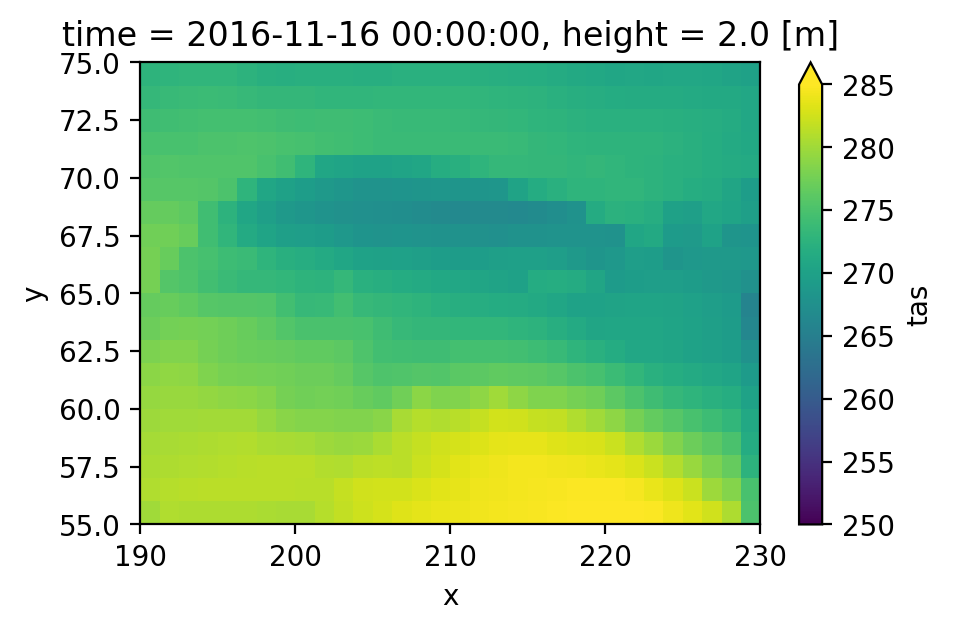

In [544]:
ds_combine.max(dim="source_id").tas.isel(time=50).plot(vmin=250, vmax=285, figsize=(5,3))

In [50]:
#ds_combine.quantile(0.95, dim=('lat','lon')).plot()

#### Bad (b/c must interpolate to a common grid)

In [ ]:
ds_combine = xr.concat(cmip6_ds_list, dim="band",)
ds_ensemble_median = ds_combine.median(dim="band")
ds_ensemble_median[-1].plot(figsize=(5,3))

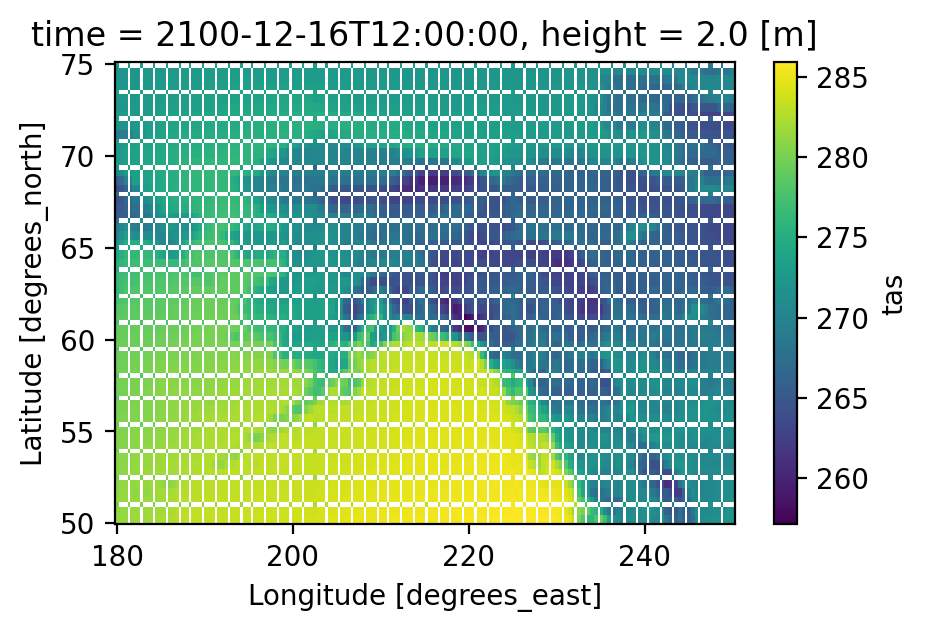

In [613]:
ds_ensemble_median[-1].plot(figsize=(5,3))

# Show full extent for a time and variable

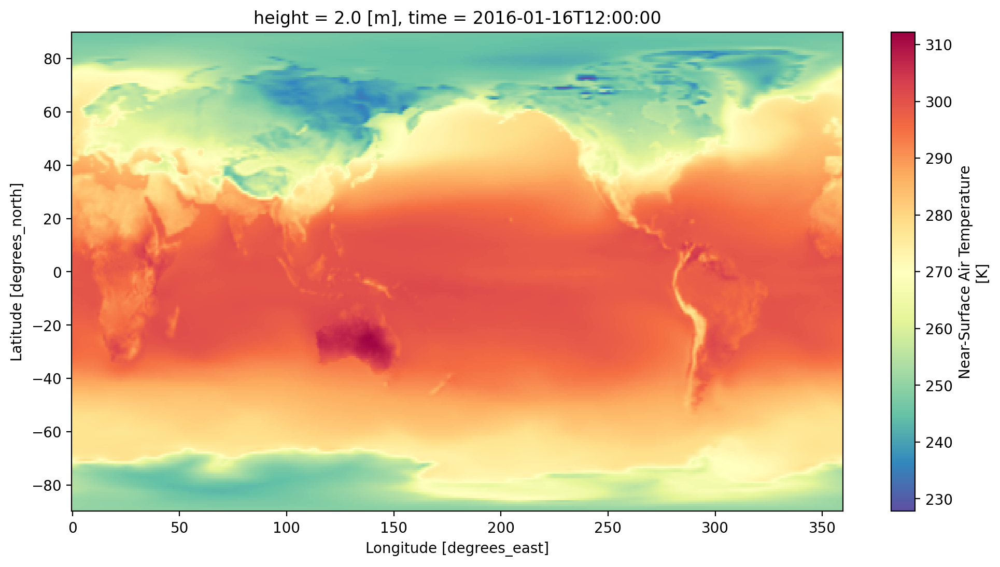

In [189]:
ds.tas.sel({'time':'2016-01'}).plot(cmap='Spectral_r')

## Subset to an extent

https://docs.xarray.dev/en/stable/examples/visualization_gallery.html

In [190]:
min_lon, max_lon, min_lat, max_lat = (180, 250, 50, 75)

mask_lon = (ds.lon >= min_lon) & (ds.lon <= max_lon)
mask_lat = (ds.lat >= min_lat) & (ds.lat <= max_lat)

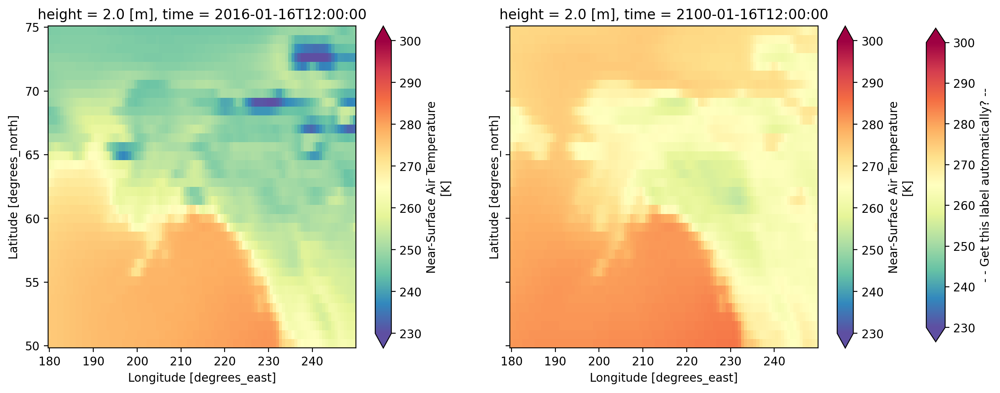

In [243]:
fig, axes = plt.subplots(nrows=1, ncols=2, sharey=True, figsize=(15,5))

TIME_LIST = ['2016-01','2100-01']

for i, ax in enumerate(axes):
    im = ds.where(mask_lon & mask_lat, drop=True).tas.sel({'time':TIME_LIST[i]}).plot(ax=ax, cmap='Spectral_r', extend='both', vmin=230, vmax=300, add_colorbar=True)

fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.825, 0.125, 0.015, 0.75])
fig.colorbar(im, cax=cbar_ax, extend='both', label='- - Get this label automatically? --')
plt.show()

## Explore subsetting and plotting options

Resources:  
https://kpegion.github.io/AOES-CLIM-WorkingWithData/02-subsetting/index.html

In [317]:
def do_plot_map(ds, map_proj, EXTENT=[min_lon, max_lon, min_lat, max_lat]):
    
    p = ds.plot(
        cmap='RdBu_r',
        transform=ccrs.PlateCarree(),  # the data's projection
        col="time",
        col_wrap=5,  # multiplot settings
       # aspect=ds.dims["lon"] / ds.dims["lat"],  # for a sensible figsize
        subplot_kws={"projection": map_proj},
        cbar_kwargs={"label": "°C"}
    )  # the plot's projection

    # We have to set the map's options on all axes
    for ax in p.axes.flat:
        ax.coastlines()
        ax.set_extent(EXTENT)

In [396]:
def do_all_plots(ds, focal_lon, focal_lat_list, EXTENT=(180, 250, 50, 75)):
    
    year_start_idx = [i for i, y in enumerate(year_range) if year_start == y][0]
    year_end_idx = [i for i, y in enumerate(year_range) if year_end == y][0]

    start_idx = (year_start_idx * month_step + focal_month)-1
    end_idx = (year_end_idx * month_step + focal_month)

    time_positions = list(range(start_idx, end_idx, step))

    min_lon, max_lon, min_lat, max_lat = EXTENT
    # This is the map projection we want to plot *onto*
    map_proj_1 = ccrs.LambertConformal(central_longitude=(min_lon+max_lon)/2, central_latitude=(min_lat+max_lat)/2)
    map_proj_2 = ccrs.LambertConformal(central_longitude=-95, central_latitude=45)

    if False:
        mask_lon = (ds.lon >= min_lon) & (ds.lon <= max_lon)
        mask_lat = (ds.lat >= min_lat) & (ds.lat <= max_lat)
        # subset to spatial extent with selection of a time range
        ds_sub_1 = ds.where(mask_lon & mask_lat, drop=True).tas.isel(time=time_positions) - 273.15
        
        do_plot_map(ds_sub_1, map_proj_1, EXTENT=EXTENT)
        do_plot_map(ds_sub_1, map_proj_2, EXTENT=EXTENT)
        do_plot_timeseries(ds_sub_1, focal_lon, focal_lat_list, dims=ds_sub_1.shape )
    
    # Correct way to crop
    ## CROPPING INTERFERES WITH THE WAY EXTENT IS USED BELOW?
    if False:
        ds = ds.sel(lat=slice(min_lat,max_lat), lon=slice(min_lon,max_lon))

    # subset only with selection of a time range --> this makes for easiest time-series plotting
    ds_sub_2 = ds.tas.isel(time=time_positions) - 273.15
    
    
    do_plot_map(ds_sub_2, map_proj_1, EXTENT=EXTENT)
    do_plot_map(ds_sub_2, map_proj_2, EXTENT=EXTENT) # this one looks the best

    do_plot_timeseries(ds_sub_2, focal_lon, focal_lat_list, dims=ds_sub_2.shape, EXTENT=[0,360-1,0,180-1])



## Set parameters for plotting

In [389]:
# ds_point=ds_sub_2.sel(lat=60,lon=210,method='nearest')

# ds_point.plot()

In [331]:
def lat2idx(lat, dim):
    return int(lat * dim/180 + dim/2)
lat2idx(90, ds.lat.shape[0])

256

In [332]:
# Set time intervals
year_range = list(range(2015,2100+1))
year_start=2020
year_end=2100
focal_month=8
year_step = 10
month_step = 12
step = year_step * month_step

/tmp/ipykernel_478/167876328.py:14: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:
/tmp/ipykernel_478/167876328.py:14: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:


shape: (9, 256, 512)
lat idxs: [199, 206, 213, 220, 228, 235]


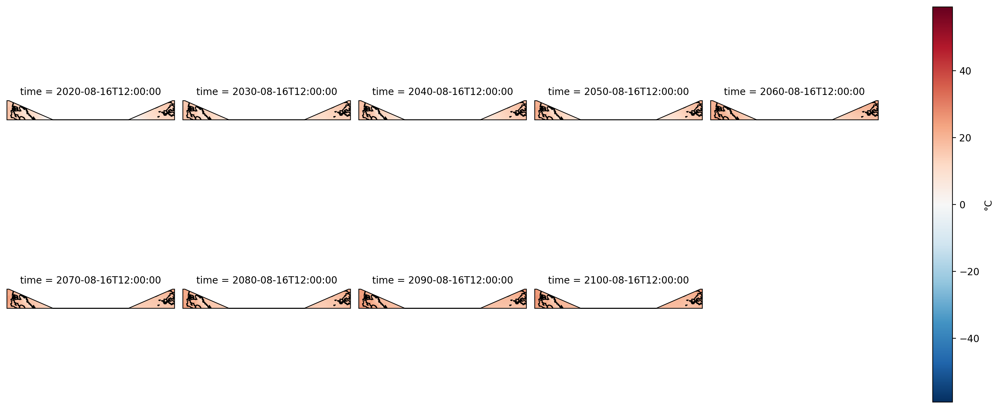

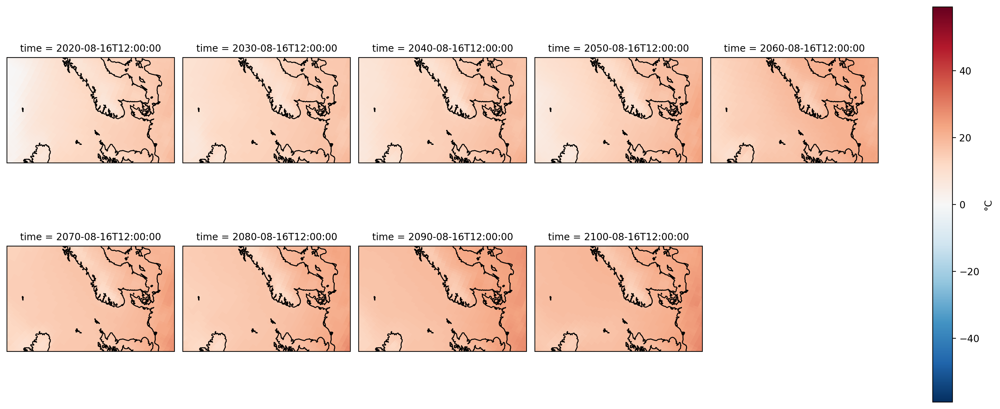

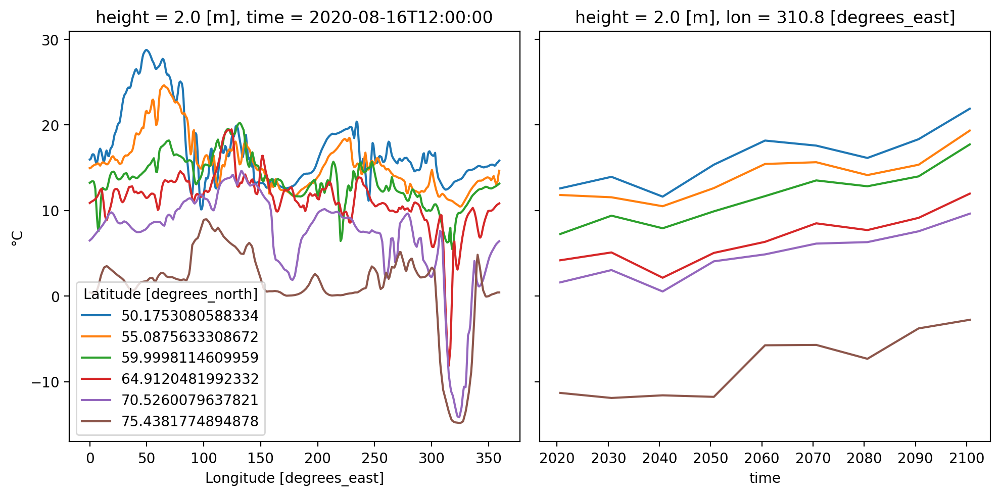

In [399]:
do_all_plots(ds, 310, [50,55,60,65,70,75], EXTENT=(10, 360, 50, 75))

In [197]:
year_start_idx = [i for i, y in enumerate(year_range) if year_start == y][0]
year_end_idx = [i for i, y in enumerate(year_range) if year_end == y][0]

start_idx = (year_start_idx * month_step + focal_month)-1
end_idx = (year_end_idx * month_step + focal_month)

time_positions = list(range(start_idx, end_idx, step))

min_lon, max_lon, min_lat, max_lat = (180, 250, 50, 75)

mask_lon = (ds.lon >= min_lon) & (ds.lon <= max_lon)
mask_lat = (ds.lat >= min_lat) & (ds.lat <= max_lat)

# subset to spatial extent with selection of a time range
ds_sub_1 = ds.where(mask_lon & mask_lat, drop=True).tas.isel(time=time_positions) - 273.15
# subset only with selection of a time range
ds_sub_2 = ds.tas.isel(time=time_positions) - 273.15

# This is the map projection we want to plot *onto*
map_proj_1 = ccrs.LambertConformal(central_longitude=(min_lon+max_lon)/2, central_latitude=(min_lat+max_lat)/2)
map_proj_2 = ccrs.LambertConformal(central_longitude=-95, central_latitude=45)

/tmp/ipykernel_478/3957889549.py:13: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:
/tmp/ipykernel_478/3957889549.py:13: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:
/tmp/ipykernel_478/3957889549.py:13: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:
/tmp/ipykernel_478/3957889549.py:13: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in p.axes.flat:


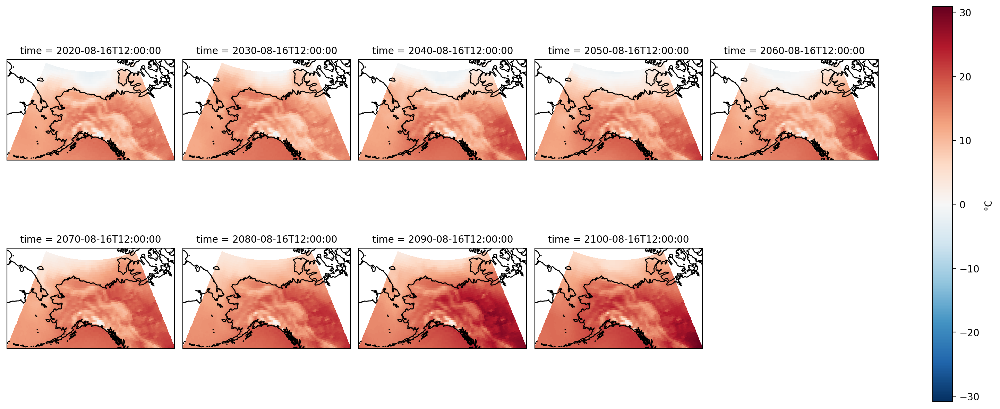

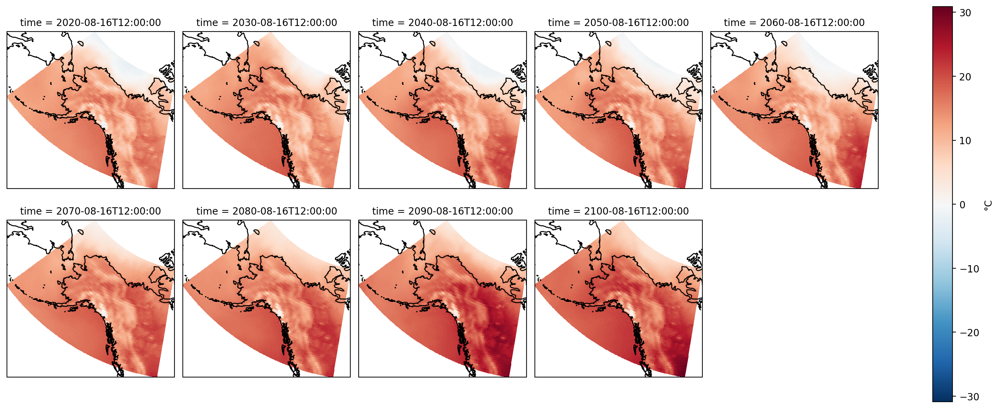

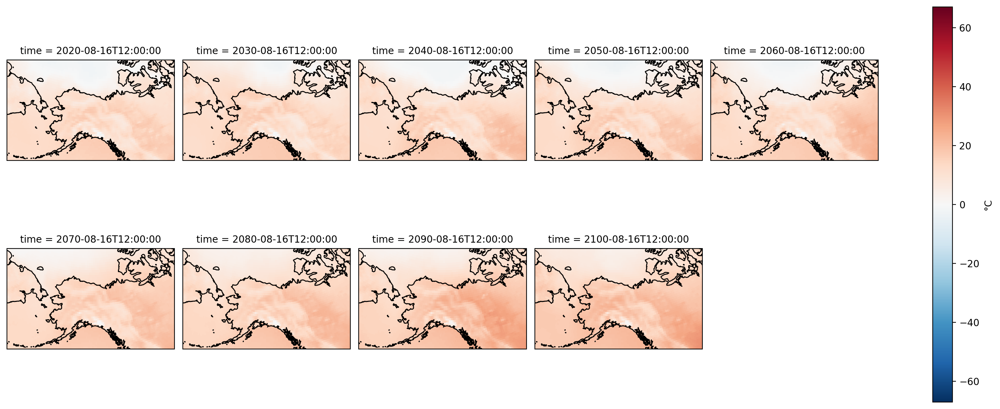

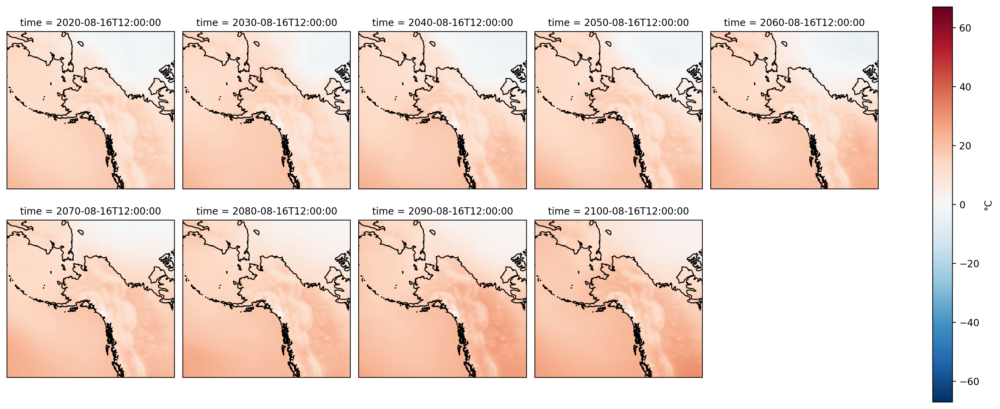

In [181]:
do_plot_map(ds_sub_1, map_proj_1)
do_plot_map(ds_sub_1, map_proj_2)
do_plot_map(ds_sub_2, map_proj_1)
do_plot_map(ds_sub_2, map_proj_2)

In [182]:
ds_sub_1

<xarray.DataArray 'tas' (time: 9, lat: 50, lon: 141)>
dask.array<sub, shape=(9, 50, 141), dtype=float32, chunksize=(1, 50, 141), chunktype=numpy.ndarray>
Coordinates:
    height   float64 2.0
  * lat      (lat) float64 50.18 50.68 51.18 51.68 ... 73.15 73.65 74.15 74.65
  * lon      (lon) float64 180.0 180.5 181.0 181.5 ... 248.5 249.0 249.5 250.0
  * time     (time) datetime64[ns] 2020-08-16T12:00:00 ... 2100-08-16T12:00:00

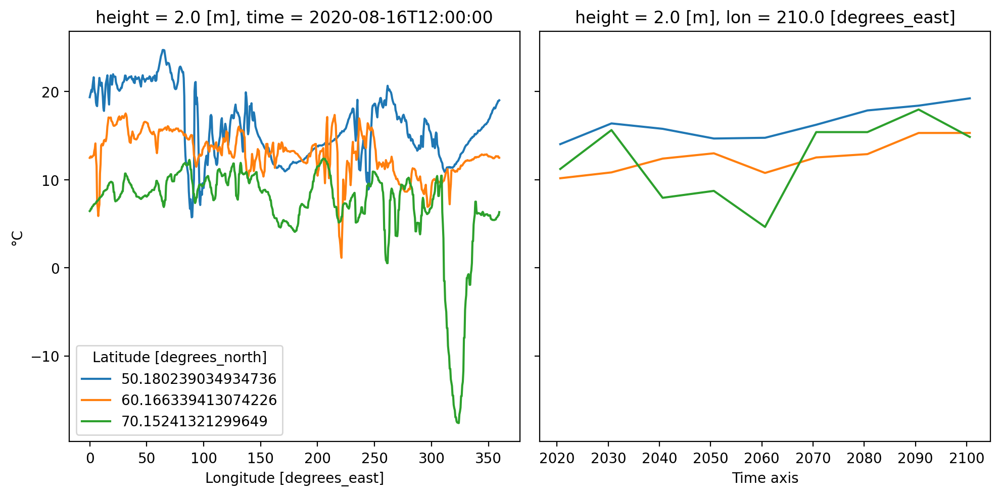

In [184]:
do_plot_timeseries(ds_sub_2, 210, dims=ds_sub_2.shape)